# Load Instrumental Tracks (Genre 79) from FMA Dataset

This notebook loads instrumental tracks (genre 79) from the Free Music Archive dataset.

In [ ]:

import torch
import torchaudio
import torchaudio.transforms as T
import yaml
from pathlib import Path
import matplotlib.pyplot as plt
import numpy as np
from datasets import load_dataset
from utills.mel import save_mel_with_metadata

# Setup paths
ROOT = Path(r"c:\Users\Dhanuja\Desktop\Vibeshift\VibeShift")
CONFIG_PATH = ROOT / "configs" / "genres.yaml"
OUTPUT_DIR = ROOT / "data" / "instrumental_samples"
OUTPUT_DIR.mkdir(parents=True, exist_ok=True)

print(f"✓ Paths configured")
print(f"  Root: {ROOT}")
print(f"  Output dir: {OUTPUT_DIR}")

✓ Paths configured
  Root: c:\Users\Dhanuja\Desktop\Vibeshift\VibeShift
  Output dir: c:\Users\Dhanuja\Desktop\Vibeshift\VibeShift\data\instrumental_samples


In [ ]:
# Load genre configuration
with open(CONFIG_PATH, 'r') as f:
    genre_config = yaml.safe_load(f)

print("Non-rock genres:")
for genre_id, genre_name in genre_config['non_rock_genres'].items():
    print(f"  {genre_id}: {genre_name}")

print(f"\n✓ Target genre: 79 (Instrumental)")

Non-rock genres:
  82: Jazz
  79: Instrumental
  96: Minimal Electronic
  144: Soundtrack
  116: Pop
  120: Progressive
  31: Classical
  51: Electronic
  45: Drum & Bass
  83: Jazz: Out

✓ Target genre: 79 (Instrumental)


In [3]:
# Load FMA dataset
print("Loading FMA dataset...")
dataset = load_dataset("benjamin-paine/free-music-archive-medium", split="train")
print(f"✓ Loaded {len(dataset):,} total samples\n")

# Show dataset structure
print("Dataset features:")
print(dataset.features)

Loading FMA dataset...


Generating train split: 100%|██████████| 24801/24801 [04:25<00:00, 93.45 examples/s] 


✓ Loaded 24,801 total samples

Dataset features:
{'audio': Audio(sampling_rate=None, decode=True, num_channels=None, stream_index=None), 'title': Value('string'), 'url': Value('string'), 'artist': Value('string'), 'composer': Value('string'), 'lyricist': Value('string'), 'publisher': Value('string'), 'genres': List(ClassLabel(names=['20th Century Classical', 'Abstract Hip-Hop', 'African', 'Afrobeat', 'Alternative Hip-Hop', 'Ambient', 'Ambient Electronic', 'Americana', 'Asia-Far East', 'Audio Collage', 'Avant-Garde', 'Balkan', 'Banter', 'Be-Bop', 'Big Band/Swing', 'Bigbeat', 'Black-Metal', 'Bluegrass', 'Blues', 'Bollywood', 'Brazilian', 'Breakbeat', 'Breakcore - Hard', 'British Folk', 'Celtic', 'Chamber Music', 'Chill-out', 'Chip Music', 'Chiptune', 'Choral Music', 'Christmas', 'Classical', 'Comedy', 'Compilation', 'Composed Music', 'Contemporary Classical', 'Country', 'Country & Western', 'Cumbia', 'Dance', 'Death-Metal', 'Deep Funk', 'Disco', 'Downtempo', 'Drone', 'Drum & Bass', 'Dubs

In [ ]:
# Filter for instrumental tracks (genre 79)
def is_instrumental(example):
    genres = example['genres']
    genre_list = genres if isinstance(genres, list) else [genres]
    return 18 in genre_list

print("Filtering for instrumental tracks (genre 79)...")
instrumental_dataset = dataset.filter(is_instrumental)

print(f"\n✓ Found {len(instrumental_dataset)} instrumental tracks")
print(f"  Percentage: {len(instrumental_dataset) / len(dataset) * 100:.2f}%")

Filtering for instrumental tracks (genre 79)...


Filter: 100%|██████████| 24801/24801 [04:00<00:00, 103.25 examples/s]


✓ Found 413 instrumental tracks
  Percentage: 1.67%


In [13]:
# Download instrumental audio files
import soundfile as sf
import re

# Set your download location here
DOWNLOAD_DIR = Path(r"C:\Users\Dhanuja\Desktop\Vibeshift\VibeShift\data\classical")
DOWNLOAD_DIR.mkdir(parents=True, exist_ok=True)

# Number of files to download (change to len(instrumental_dataset) for all)
num_to_download = min(len(instrumental_dataset), len(instrumental_dataset))

print(f"Downloading {num_to_download} instrumental audio files to {DOWNLOAD_DIR}...\n")

for i in range(num_to_download):
    sample = instrumental_dataset[i]
    
    # Get audio data
    audio_data = sample['audio']
    waveform = audio_data['array']
    sr = audio_data['sampling_rate']
    
    # Create filename (sanitize for filesystem - remove all special characters)
    track_id = sample.get('track_id', 'unknown')
    title = sample.get('title', 'unknown')
    
    # Remove or replace problematic characters
    title = re.sub(r'[<>:"/\\|?*\x00-\x1f]', '', title)  # Remove invalid Windows chars
    title = re.sub(r'[^\w\s-]', '', title)  # Keep only alphanumeric, spaces, hyphens
    title = title.strip()[:50]  # Limit length
    
    filename = f"{i:05d}_{title}.wav"
    save_path = DOWNLOAD_DIR / filename
    
    try:
        # Save as WAV file
        sf.write(save_path, waveform, sr)
        print(f"  [{i+1}/{num_to_download}] Downloaded: {filename}")
    except Exception as e:
        print(f"  [{i+1}/{num_to_download}] Error saving {filename}: {str(e)}")
        continue

print(f"\n✓ Downloaded {num_to_download} audio files to {DOWNLOAD_DIR}")


  [1/413] Downloaded: 00000_Preludes Book 2 -.wav
  [2/413] Downloaded: 00001_Preludes Book 2 - La puerta del Vino.wav
  [3/413] Downloaded: 00002_Sonata No 1 in F Minor Op 2 No 1 - I Allegro.wav
  [4/413] Downloaded: 00003_Sonata No 1 in F Minor Op 2 No 1 - II Adagio.wav
  [5/413] Downloaded: 00004_Sonata No 1 in F Minor Op 2 No 1 - III Menuetto Al.wav
  [6/413] Downloaded: 00005_Sonata No 1 in F Minor Op 2 No 1 - IV Prestissimo.wav
  [7/413] Downloaded: 00006_Sonata No 32 in C Minor Op 111 - I Maestoso - Alle.wav
  [8/413] Downloaded: 00007_Promenade Allegro giusto nel modo russico senza al.wav
  [9/413] Downloaded: 00008_I Gnomus Vivo.wav
  [10/413] Downloaded: 00009_II Il vecchio castello Andante.wav
  [11/413] Downloaded: 00010_III Tuileries Allegretto non troppo capriccioso.wav
  [12/413] Downloaded: 00011_IV Bydlo Sempre moderato pesante.wav
  [13/413] Downloaded: 00012_V Ballet des poussins dans leurs coques Scherzino .wav
  [14/413] Downloaded: 00013_VI Samuel Goldenberg and 

In [5]:
# Display information about first few instrumental tracks
if len(instrumental_dataset) > 0:
    print("\nFirst 5 instrumental tracks:")
    for i in range(min(5, len(instrumental_dataset))):
        sample = instrumental_dataset[i]
        genres = sample['genres'] if isinstance(sample['genres'], list) else [sample['genres']]
        print(f"\n{i+1}. Track ID: {sample.get('track_id', 'N/A')}")
        print(f"   Title: {sample.get('title', 'N/A')}")
        print(f"   Artist: {sample.get('artist_name', 'N/A')}")
        print(f"   Genres: {genres}")
        print(f"   Duration: {sample.get('duration', 'N/A')}s")
else:
    print("\n⚠ No instrumental tracks found")


First 5 instrumental tracks:

1. Track ID: N/A
   Title: Preludes, Book 2 - 
   Artist: N/A
   Genres: [31]
   Duration: N/As

2. Track ID: N/A
   Title: Preludes, Book 2 - La puerta del Vino
   Artist: N/A
   Genres: [31]
   Duration: N/As

3. Track ID: N/A
   Title: Sonata No. 1 in F Minor, Op. 2 No. 1 - I. Allegro
   Artist: N/A
   Genres: [31]
   Duration: N/As

4. Track ID: N/A
   Title: Sonata No. 1 in F Minor, Op. 2 No. 1 - II. Adagio
   Artist: N/A
   Genres: [31]
   Duration: N/As

5. Track ID: N/A
   Title: Sonata No. 1 in F Minor, Op. 2 No. 1 - III. Menuetto Allegretto
   Artist: N/A
   Genres: [31]
   Duration: N/As



Loading first instrumental track...
✓ Audio loaded
  Shape: torch.Size([1, 1321967])
  Sample rate: 44100 Hz
  Duration: 29.98s


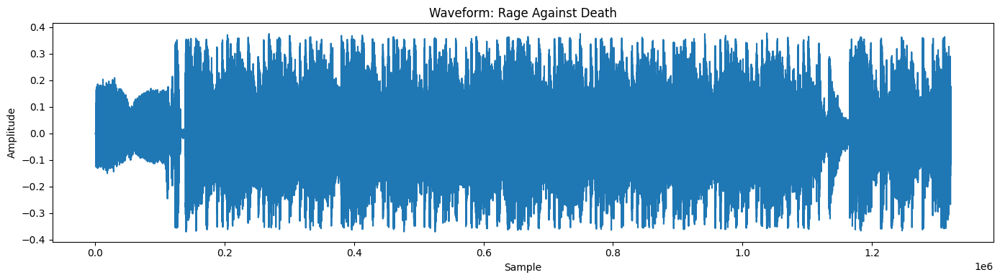

In [19]:
# Load and visualize audio from first instrumental track
if len(instrumental_dataset) > 0:
    print("\nLoading first instrumental track...")
    sample = instrumental_dataset[0]
    
    # Get audio data
    audio_data = sample['audio']
    waveform = torch.tensor(audio_data['array']).float()
    sample_rate = audio_data['sampling_rate']
    
    # Convert to mono if stereo
    if waveform.ndim > 1:
        waveform = torch.mean(waveform, dim=0)
    waveform = waveform.unsqueeze(0)
    
    print(f"✓ Audio loaded")
    print(f"  Shape: {waveform.shape}")
    print(f"  Sample rate: {sample_rate} Hz")
    print(f"  Duration: {waveform.shape[-1] / sample_rate:.2f}s")
    
    # Plot waveform
    plt.figure(figsize=(14, 4))
    plt.plot(waveform[0].numpy())
    plt.xlabel('Sample')
    plt.ylabel('Amplitude')
    plt.title(f'Waveform: {sample.get("title", "Unknown")}')
    plt.tight_layout()
    plt.show()
else:
    print("\n⚠ No instrumental tracks to display")

## Play Instrumental Audio

In [6]:
# Play instrumental tracks
from IPython.display import Audio, display

if len(instrumental_dataset) > 0:
    # Number of tracks to play
    num_to_play = min(3, len(instrumental_dataset))
    
    print(f"Playing {num_to_play} instrumental tracks:\n")
    
    for i in range(num_to_play):
        sample = instrumental_dataset[i]
        
        # Get audio data
        audio_data = sample['audio']
        waveform = torch.tensor(audio_data['array']).float()
        sr = audio_data['sampling_rate']
        
        # Convert to mono if stereo
        if waveform.ndim > 1:
            waveform = torch.mean(waveform, dim=0)
        
        # Normalize
        waveform = waveform / waveform.abs().max() if waveform.abs().max() > 0 else waveform
        
        print(f"{i+1}. {sample.get('title', 'Unknown')} - {sample.get('artist_name', 'Unknown Artist')}")
        print(f"   Duration: {waveform.shape[-1] / sr:.2f}s")
        
        # Display audio player
        display(Audio(waveform.numpy(), rate=sr))
        print()
else:
    print("⚠ No instrumental tracks to play")

Playing 3 instrumental tracks:

1. Preludes, Book 2 -  - Unknown Artist
   Duration: 30.00s



2. Preludes, Book 2 - La puerta del Vino - Unknown Artist
   Duration: 30.00s



3. Sonata No. 1 in F Minor, Op. 2 No. 1 - I. Allegro - Unknown Artist
   Duration: 29.98s


## Create Mel Spectrogram from Instrumental Track

In [ ]:
# Convert first instrumental track to mel spectrogram
if len(instrumental_dataset) > 0:
    print("Creating mel spectrogram...")
    
    # Resample to 24000 Hz if needed
    target_sr = 24000
    if sample_rate != target_sr:
        resampler = T.Resample(sample_rate, target_sr)
        waveform = resampler(waveform)
        sample_rate = target_sr
        print(f"  Resampled to {target_sr} Hz")
    
    # Create mel spectrogram
    mel_transform = T.MelSpectrogram(
        sample_rate=sample_rate,
        n_fft=1024,
        hop_length=256,
        n_mels=100,
        f_min=0,
        f_max=8000
    )
    
    mel = mel_transform(waveform)
    
    print(f"✓ Mel spectrogram created")
    print(f"  Shape: {mel.shape}")
    print(f"  Min: {mel.min():.4f}, Max: {mel.max():.4f}")
    
    # Visualize mel spectrogram
    plt.figure(figsize=(14, 5))
    plt.imshow(mel.squeeze().numpy(), aspect='auto', origin='lower', cmap='viridis')
    plt.colorbar(label='Amplitude')
    plt.xlabel('Time Frames')
    plt.ylabel('Mel Frequency Bins')
    plt.title(f'Mel Spectrogram: {sample.get("title", "Unknown")}')
    plt.tight_layout()
    plt.show()

## Save Instrumental Mel Spectrograms

In [19]:
# Save first N instrumental tracks as mel spectrograms
import sys



num_to_save = min(10, len(instrumental_dataset))

print(f"Saving {num_to_save} instrumental mel spectrograms...")

for i in range(len(instrumental_dataset)):
    sample = instrumental_dataset[i]
    
    # Get audio file path from downloaded files
    track_id = sample.get('track_id', 'unknown')
    title = sample.get('title', 'unknown')
    
    # Sanitize title to match saved filename
    import re
    title = re.sub(r'[<>:"/\\|?*\x00-\x1f]', '', title)
    title = re.sub(r'[^\w\s-]', '', title)
    title = title.strip()[:50]
    
    audio_path = DOWNLOAD_DIR / f"{i:05d}_{title}.wav"
    save_path = OUTPUT_DIR / f"{i:05d}_instrum_mel.pt"
    
    try:
        # Use mel.py function with genre_id 31 for instrumental
        save_mel_with_metadata(
            audio_path=audio_path,
            output_path=save_path,
            genre_id=0,
            bpm=None
        )
    except Exception as e:
        print(f"  [{i+1}/{len(instrumental_dataset)}] Error processing {audio_path.name}: {str(e)}")
        continue

print(f"\n✓ Saved {len(instrumental_dataset)} instrumental mel spectrograms to {OUTPUT_DIR}")

Saving 10 instrumental mel spectrograms...
Saved c:\Users\Dhanuja\Desktop\Vibeshift\VibeShift\data\instrumental_samples\00000_instrum_mel.pt: genre=0, shape=torch.Size([1, 100, 2813])
Saved c:\Users\Dhanuja\Desktop\Vibeshift\VibeShift\data\instrumental_samples\00001_instrum_mel.pt: genre=0, shape=torch.Size([1, 100, 2813])
Saved c:\Users\Dhanuja\Desktop\Vibeshift\VibeShift\data\instrumental_samples\00002_instrum_mel.pt: genre=0, shape=torch.Size([1, 100, 2811])
Saved c:\Users\Dhanuja\Desktop\Vibeshift\VibeShift\data\instrumental_samples\00003_instrum_mel.pt: genre=0, shape=torch.Size([1, 100, 2811])
Saved c:\Users\Dhanuja\Desktop\Vibeshift\VibeShift\data\instrumental_samples\00004_instrum_mel.pt: genre=0, shape=torch.Size([1, 100, 2811])
Saved c:\Users\Dhanuja\Desktop\Vibeshift\VibeShift\data\instrumental_samples\00005_instrum_mel.pt: genre=0, shape=torch.Size([1, 100, 2811])
Saved c:\Users\Dhanuja\Desktop\Vibeshift\VibeShift\data\instrumental_samples\00006_instrum_mel.pt: genre=0, sha

## Statistics

In [20]:
# Show overall statistics
if len(instrumental_dataset) > 0:
    print(f"\n{'='*60}")
    print(f"INSTRUMENTAL TRACKS SUMMARY")
    print(f"{'='*60}")
    print(f"Total instrumental tracks: {len(instrumental_dataset)}")
    print(f"Percentage of dataset: {len(instrumental_dataset) / len(dataset) * 100:.2f}%")
    #print(f"Saved mel spectrograms: {num_to_save}")
    print(f"Output directory: {OUTPUT_DIR}")
    print(f"{'='*60}")


INSTRUMENTAL TRACKS SUMMARY
Total instrumental tracks: 413
Percentage of dataset: 1.67%
Output directory: c:\Users\Dhanuja\Desktop\Vibeshift\VibeShift\data\instrumental_samples
